**Выпускная квалификационная работа по курсу «Data Science PRO 2.0»**

Слушатель: Тимошевский Александр Станиславович

**Тема: "Прогнозирование конечных свойств новых материалов (композиционных материалов)".** 

**Задание**.
1. Обучить алгоритм машинного обучения, который будет определять значения:
- Модуль упругости при растяжении, ГПа;
- Прочность при растяжении, МПа.
2. Написать нейронную сеть, которая будет рекомендовать:
- Соотношение матрица-наполнитель.
3. Написать приложение, которое будет выдавать прогноз, полученный в задании 2.

**Описание:**

Композиционные материалы — это искусственно созданные материалы, состоящие из нескольких других с четкой границей между ними. Композиты обладают теми свойствами, которые не наблюдаются у компонентов по отдельности. При этом композиты являются монолитным материалом, т.е. компоненты материала неотделимы друг от друга без разрушения конструкции в целом. Яркий пример композита — железобетон. Бетон прекрасно сопротивляется сжатию, но плохо растяжению. Стальная арматура внутри бетона компенсирует его неспособность сопротивляться сжатию, формируя тем самым новые, уникальные свойства. Современные композиты изготавливаются из других материалов: полимеры, керамика, стеклянные и углеродные волокна, но данный принцип сохраняется. У такого подхода есть и недостаток: даже если мы знаем характеристики исходных компонентов, определить характеристики композита, состоящего из этих компонентов, достаточно проблематично. Для решения этой проблемы есть два пути: физические испытания образцов материалов или прогнозирование характеристик. Суть прогнозирования заключается в симуляции представительного элемента объема композита на основе данных о характеристиках входящих компонентов (связующего и армирующего компонента).
На входе имеются данные о начальных свойствах компонентов композиционных материалов (количество связующего, наполнителя, температурный режим отверждения и т.д.). На выходе необходимо спрогнозировать ряд конечных свойств получаемых композиционных материалов. 

**Актуальность:** 

Созданные прогнозные модели помогут сократить количество проводимых испытаний, а также пополнить базу данных материалов возможными новыми характеристиками материалов и цифровыми двойниками новых композитов.


**Часть 1. Описательный и разведочный анализ, предоставленных для исследования данных**

Данные для исследования (датасет со свойствами композитов) размещены в сети Интернет по адресу: https://drive.google.com/file/d/1B1s5gBlvgU81H9GGolLQVw_SOi-vyNf2/view?usp=sharing.

Данные разделены на два файла:
- файл "X_bp.xlsx";
- файл "X_nup.xlsx".
Формат ".xlsx" это формат файла, используемый для хранения электронных таблиц в программе Microsoft Excel.

Загружаем библиотеки необходимые для проведения ислледования

In [167]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import missingno as msno

from sklearn.preprocessing import OneHotEncoder, MinMaxScaler
import warnings
warnings.filterwarnings('ignore')

С помощью библиотеки pandas осуществляем чтение данных из файлов (датасетов)

In [168]:
data_frame1 = pd.read_excel("X_bp.xlsx")
data_frame2 = pd.read_excel("X_nup.xlsx")

Данные загружены и присвоены переменным data_frame1 и data_frame2.


**Рассмотрим общие сведения о data_frame1**

Выведим 3 первыx строки с данными из data_frame1

In [169]:
data_frame1.head(3)

,Unnamed: 0,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
0,0,1.857143,2030.0,738.736842,30.0,22.267857,100.000000,210.0,70.0,3000.0,220.0
1,1,1.857143,2030.0,738.736842,50.0,23.750000,284.615385,210.0,70.0,3000.0,220.0
2,2,1.857143,2030.0,738.736842,49.9,33.000000,284.615385,210.0,70.0,3000.0,220.0


Выведим 3 последних строки с данными из data_frame1

In [170]:
data_frame1.tail(3)

,Unnamed: 0,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
1020,1020,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764
1021,1021,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067
1022,1022,3.808020,1890.413468,417.316232,129.183416,27.474763,300.952708,758.747882,74.309704,2856.328932,194.754342


Выведим 3 случайных строки с данными из data_frame1

In [171]:
data_frame1.sample(3)

,Unnamed: 0,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
383,383,2.709714,1963.169297,766.471349,135.144779,24.693930,222.276036,376.967176,73.677834,1892.581263,269.239867
971,971,2.169074,1889.513179,803.346469,132.528295,24.075555,323.153659,450.429300,75.336917,2147.576085,244.606070
618,618,3.276517,1911.245306,213.466388,78.847811,21.778934,226.990371,113.590494,72.695218,2734.030447,223.770443


Выводим информацию об общем размере data_frame1 (количество строк и количество столбцов)

In [172]:
data_frame1.shape

(1023, 11)

Итого таблица № 1 с предложенными данными содержит 11 столбцов и 1023 строки.

Получаем общее описание data_frame1 с помощью метода pandas.DataFrame.info()

In [173]:
data_frame1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1023 entries, 0 to 1022
Data columns (total 11 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Unnamed: 0                            1023 non-null   int64  
 1   Соотношение матрица-наполнитель       1023 non-null   float64
 2   Плотность, кг/м3                      1023 non-null   float64
 3   модуль упругости, ГПа                 1023 non-null   float64
 4   Количество отвердителя, м.%           1023 non-null   float64
 5   Содержание эпоксидных групп,%_2       1023 non-null   float64
 6   Температура вспышки, С_2              1023 non-null   float64
 7   Поверхностная плотность, г/м2         1023 non-null   float64
 8   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 9   Прочность при растяжении, МПа         1023 non-null   float64
 10  Потребление смолы, г/м2               1023 non-null   float64
dtypes: float64(10), i

Из общего описания делаем дополнительный вывод о том, что в таблице представлены 2 типа данных:
- int64 - это 32-битный целочисленный тип данных. Он используется для представления целых чисел.
- float32 -  это 64-битный формат представления чисел с плавающей точкой. Он используется для хранения вещественных чисел.

Кроме того, отмечаем что столбец "Unnamed:0" содержит нумерацию строк электронной таблицы.

**Рассмотрим общие сведения о data_frame2**

Выведим 3 первыx строки с данными из data_frame2

In [174]:
data_frame2.head(3)

,Unnamed: 0,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0,0,4.0,57.0
1,1,0,4.0,60.0
2,2,0,4.0,70.0


Выведим 3 последних строки с данными из data_frame2

In [175]:
data_frame2.tail(3)

,Unnamed: 0,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
1037,1037,90,9.800926,72.858286
1038,1038,90,10.079859,65.519479
1039,1039,90,9.021043,66.920143


Выведим 3 случайных строки с данными из data_frame2

In [176]:
data_frame2.sample(3)

,Unnamed: 0,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
50,50,0,6.303773,72.152019
407,407,0,12.634844,37.547373
268,268,0,4.803995,79.931964


Выводим информацию об общем размере data_frame2 (количество строк и количество столбцов)

In [177]:
data_frame2.shape

(1040, 4)

Итого таблица № 2 с предложенными данными содержит 4 столбца и 1040 строк.

Получаем общее описание data_frame2 с помощью метода pandas.DataFrame.info()

In [178]:
data_frame2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1040 entries, 0 to 1039
Data columns (total 4 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Unnamed: 0          1040 non-null   int64  
 1   Угол нашивки, град  1040 non-null   int64  
 2   Шаг нашивки         1040 non-null   float64
 3   Плотность нашивки   1040 non-null   float64
dtypes: float64(2), int64(2)
memory usage: 32.6 KB


Из общего описания делаем дополнительный вывод о том, что в таблице представлены 2 типа данных:

int64 - это 32-битный целочисленный тип данных. Он используется для представления целых чисел.
float32 - это 64-битный формат представления чисел с плавающей точкой. Он используется для хранения вещественных чисел.

Кроме того, отмечаем что столбец "Unnamed:0" содержит нумерацию строк электронной таблицы.

**Объединение предоставленных данных**

В соотвтетствии с требованиями к ВКР, предоставленные данные должны быть объединены в одну таблицу. 
Объединение должно производиться по индексам, тип объединения - INNER.
Это самый распространенный тип объединения. С его помощью происходит объединение записей из двух таблиц по связующему полю, если оно содержит одинаковые значения в обеих таблицах.

Перед объединением таблицы № 1 (data_frame1) и таблицы № 2(data_frame2) исключаем из них столбцы "Unnamed: 0" в которых содержится нумерация строк. Данные столбцы не влияют на результаты исследования.

In [179]:
data_frame1.drop(["Unnamed: 0"],axis=1, inplace=True)

In [180]:
# Проверяем, что столбец "Unnamed: 0" успешно удален из таблицы № 1
data_frame1.tail(5)

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
1018,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669
1019,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099
1020,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764
1021,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067
1022,3.808020,1890.413468,417.316232,129.183416,27.474763,300.952708,758.747882,74.309704,2856.328932,194.754342


In [181]:
# Проверяем, что столбец "Unnamed: 0" успешно удален из таблицы № 1
data_frame1.shape

(1023, 10)

Удостоверились, что исключен столбец "Unnamed: 0". Столбцов стало 10, а количество строк прежнее - 1023.

In [182]:
data_frame2.drop(["Unnamed: 0"],axis=1, inplace=True)

In [183]:
# Проверяем, что столбец "Unnamed: 0" успешно удален из таблицы № 2
data_frame2.tail(5)

,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
1035,90,8.088111,47.759177
1036,90,7.619138,66.931932
1037,90,9.800926,72.858286
1038,90,10.079859,65.519479
1039,90,9.021043,66.920143


In [184]:
# Проверяем, что столбец "Unnamed: 0" успешно удален из таблицы № 2
data_frame2.shape

(1040, 3)

Удостоверились, что исключен столбец "Unnamed: 0". Столбцов стало 3, а количество строк прежнее - 1040.

Осуществляем объединение таблиц

Метод DataFrame.merge() модуля pandas выполняет объединение DataFrame или именованные объекты Series с помощью соединения в стиле базы данных.

In [185]:
df = data_frame1.merge(data_frame2, left_index = True, right_index = True, how = 'inner')

In [186]:
df.head(3)

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.0,738.736842,30.0,22.267857,100.000000,210.0,70.0,3000.0,220.0,0,4.0,57.0
1,1.857143,2030.0,738.736842,50.0,23.750000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,60.0
2,1.857143,2030.0,738.736842,49.9,33.000000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,70.0


In [187]:
df.tail(3)

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
1020,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764,90,4.161154,67.629684
1021,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067,90,6.313201,58.261074
1022,3.808020,1890.413468,417.316232,129.183416,27.474763,300.952708,758.747882,74.309704,2856.328932,194.754342,90,6.078902,77.434468


In [188]:
df.sample(3)

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
924,1.862875,1993.662575,102.490025,142.797271,24.154225,354.890074,26.053941,74.553726,2100.602732,211.743890,90,6.759424,60.888620
17,4.193548,1950.000000,506.000000,129.000000,21.250000,300.000000,380.000000,75.000000,1800.000000,120.000000,0,10.000000,60.000000
750,3.273888,1968.408963,928.020607,104.943294,22.980391,291.946090,339.140842,74.847458,2648.655464,282.835721,90,7.083955,52.843871


In [189]:
df.shape

(1023, 13)

Удостоверились, что с помощью метода pandas.DataFrame.merge() произведено объединение таблиц № 1 и 2. Объединение произведено по индексам, методом INNER. Итоговая таблица имеет размер 13 столбцов и 1023 строки.
Отмечаем, что 17 строк из таблицы № 2 не вошли в объединенную таблицу, так как за основу объединения бралась таблица № 1, в которой отсутствовала информация по этим 17 строкам.

**Описательный анализ объединенных из таблиц данных** 

In [190]:
# Выводим данные датафрейма
df

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.000000,738.736842,30.000000,22.267857,100.000000,210.000000,70.000000,3000.000000,220.000000,0,4.000000,57.000000
1,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000,0,4.000000,60.000000
2,1.857143,2030.000000,738.736842,49.900000,33.000000,284.615385,210.000000,70.000000,3000.000000,220.000000,0,4.000000,70.000000
3,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000,0,5.000000,47.000000
4,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0,5.000000,57.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669,90,9.076380,47.019770
1019,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099,90,10.565614,53.750790
1020,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764,90,4.161154,67.629684
1021,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067,90,6.313201,58.261074


Название столбцов и их описание.

| Названия столбцов | Описание полей                | 
|:-------------     |:---------------:              | 
| Соотношение матрица-наполнитель       | матрица - это связующее вещество, в которое внедрен наполнитель (волокна, частицы, слои). Соотношение может быть выражено в процентах или в виде объемного или весового соотношения.| 
| Плотность, кг/м3| физическая величина, характеризующая массу вещества, содержащегося в единице объема. Выражен в килограмме на кубический метр.| 
| модуль упругости, ГПа  | физическая величина, характеризующая способность твердого тела сопротивляться упругой деформации при приложении к нему силы. Выражен в Гигапаскаль.| 
| Количество отвердителя, м.%           | отвердитель  – это химическое вещество, которое добавляется к лакокрасочным материалам, эпоксидным смолам и другим реакционноспособным олигомерам для ускорения или инициирования процесса отверждения (застывания, полимеризации).|
| Содержание эпоксидных групп,%_2          | эпоксидные группы – это структурные единицы в молекулах эпоксидных смол, которые обеспечивают их способность к отвердеванию под действием отвердителей.|
| Температура вспышки, С_2           | это самая низкая температура, при которой пары над поверхностью горючего вещества способны вспыхнуть при поднесении к ним источника зажигания, но устойчивое горение после удаления источника зажигания не наблюдается.|
| Поверхностная плотность, г/м2           | величина, характеризующая массу вещества, приходящуюся на единицу площади. Выражен в грамм на метр кубический |
| Модуль упругости при растяжении, ГПа          | ценивает упругость жестких или твердых материалов, которая является соотношением между деформацией материала и силой, необходимой для его деформации. Выражен в Гигапаскаль.|
| Прочность при растяжении, МПа         | максимальное напряжение, которое материал может выдержать при растягивающей нагрузке до начала разрушения. Это важный показатель для оценки прочности и надежности материалов. Выжаражен в Мегапаскаль.|
| Потребление смолы, г/м2        | потребление эпоксидной смолы. Выражен в граммах на квадратный метр|
| Угол нашивки, град        | угол нашивки. Выражен в градусах         |
| Шаг нашивки        | шаг нашивки         |
| Плотность нашивки       | плотность нашивки        |


Вычисляем общее количество значений в таблице.

In [191]:
# Общее количество значений равно произведению количества строк на столбцы
df.size

13299

Выводим общую информацию о таблице

In [192]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1023 entries, 0 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
 10  Угол нашивки, град                    1023 non-null   int64  
 11  Шаг нашивки           

Метод pd.DataFrame.info() указывает на отсутствует пропущенных значений. В таблице используются числовые типы данных - для целых чисел (int64) и для чисел с плавающей точкой (float64).

Дополнительно исследуем пропущенные таблицы в датасете

In [193]:
df.isna().sum()

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки, град                      0
Шаг нашивки                             0
Плотность нашивки                       0
dtype: int64

In [194]:
df.isnull().sum()

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки, град                      0
Шаг нашивки                             0
Плотность нашивки                       0
dtype: int64

In [195]:
df.isnull().sum().sum()

np.int64(0)

С помощью библиотеки missingno дополнительно исследуем пропуски в датасете

<Axes: >

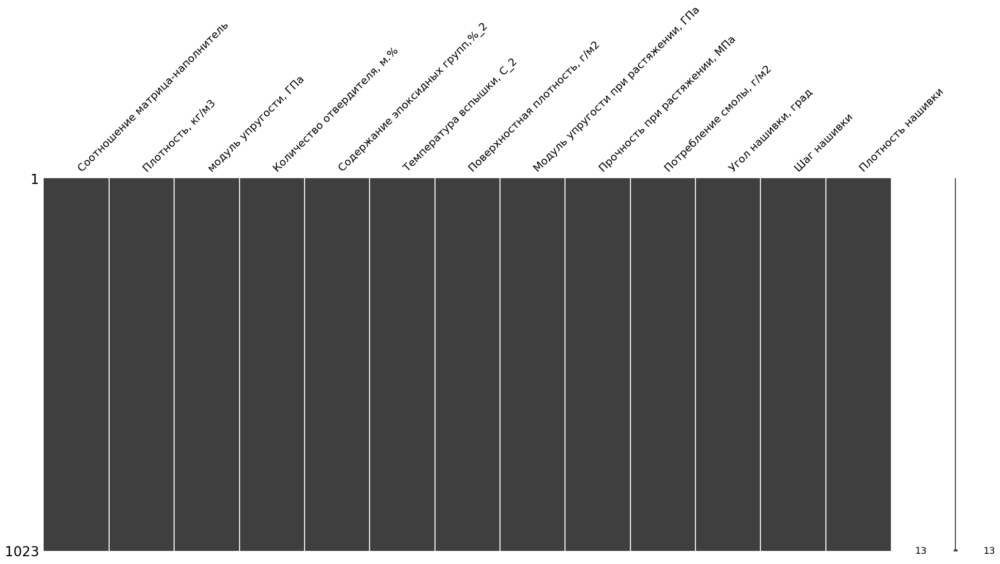

In [196]:
msno.matrix(df)

Пропущенные значения в датасете отсутсвуют. Совершение каких-либо действий по удалению пропущенных значений не требуется.

Проверяем уникальные значения в таблице

In [197]:
df.nunique()

Соотношение матрица-наполнитель         1014
Плотность, кг/м3                        1013
модуль упругости, ГПа                   1020
Количество отвердителя, м.%             1005
Содержание эпоксидных групп,%_2         1004
Температура вспышки, С_2                1003
Поверхностная плотность, г/м2           1004
Модуль упругости при растяжении, ГПа    1004
Прочность при растяжении, МПа           1004
Потребление смолы, г/м2                 1003
Угол нашивки, град                         2
Шаг нашивки                              989
Плотность нашивки                        988
dtype: int64

Отмечаем, что большинство переменных имеют уникальные значения и какая-либо общая тенденция отсутствует. Так же обнаруживаем что столбец "Угол нашивки, град" имеет только 2 уникальных значения в 1023 строках.

In [198]:
# Выводим уникальные значения переменной "Угол нашивки, град"
df["Угол нашивки, град"].unique()

array([ 0, 90])

Такими значениями являются - 0 и 90. Как следует из наименования столбца единица измерения градусы.

С помошью метода pd.DataFrame.describe() выводим описательную статистику датасета. Также преобразуем таблицу с помощью транспонирования для более удобной оценки параметров.

In [199]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,1023.0,2.930366,0.913222,0.389403,2.317887,2.906878,3.552660,5.591742
"Плотность, кг/м3",1023.0,1975.734888,73.729231,1731.764635,1924.155467,1977.621657,2021.374375,2207.773481
"модуль упругости, ГПа",1023.0,739.923233,330.231581,2.436909,500.047452,739.664328,961.812526,1911.536477
"Количество отвердителя, м.%",1023.0,110.570769,28.295911,17.740275,92.443497,110.564840,129.730366,198.953207
"Содержание эпоксидных групп,%_2",1023.0,22.244390,2.406301,14.254985,20.608034,22.230744,23.961934,33.000000
"Температура вспышки, С_2",1023.0,285.882151,40.943260,100.000000,259.066528,285.896812,313.002106,413.273418
"Поверхностная плотность, г/м2",1023.0,482.731833,281.314690,0.603740,266.816645,451.864365,693.225017,1399.542362
"Модуль упругости при растяжении, ГПа",1023.0,73.328571,3.118983,64.054061,71.245018,73.268805,75.356612,82.682051
"Прочность при растяжении, МПа",1023.0,2466.922843,485.628006,1036.856605,2135.850448,2459.524526,2767.193119,3848.436732
"Потребление смолы, г/м2",1023.0,218.423144,59.735931,33.803026,179.627520,219.198882,257.481724,414.590628


| Название показателя                              | Описание               | 
|:-------------     |:---------------:              | 
| Count       | Количество элементов в столбце| 
| Mean|  Среднее арифметическое|
|  Std  | Среднее квадратичное отклонение|
| Min          | Минимальное значение|
| Max      | Максимальное значение|
| 25%           | Первый (25%) квартиль |
| 50%          | Медиана, второй (50%) квартиль|
| 75%         | Третий (75%) квартиль|


Таким образом, вывели количество элементов (count), среднее арифметическое (mean), среднее квадратичное отклонение (std), минимальное (min) и максимальное (max) значение, первый (25%), второй (50%) и третий (75%) квартили по всему датасету.
Дополнительно отмечаем, что данные в таблице определяются в разных единицах измерения и имеется большой разброс в  масштабе данных.
Так же такую информацию можно получить с помощью методов  df.mean(), df.median(), df.std(), df.min(), df. max() и т.д.

Проверям датасет на наличие дубликатов

In [200]:
df.duplicated()

0       False
1       False
2       False
3       False
4       False
        ...  
1018    False
1019    False
1020    False
1021    False
1022    False
Length: 1023, dtype: bool

In [201]:
df.duplicated().sum()

np.int64(0)

Дублирующей информации в датасете не обнаружено

**Осуществляем исследование данных с помощью визуальных способов исследования (построения графиков)**

Еще раз выводим информацию о первых и последних 5 строках датасета для наглядности

In [202]:
df.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,0,4.0,57.0
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,60.0
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,70.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0,5.0,47.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,57.0


In [203]:
df.tail()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
1018,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669,90,9.076380,47.019770
1019,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099,90,10.565614,53.750790
1020,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764,90,4.161154,67.629684
1021,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067,90,6.313201,58.261074
1022,3.808020,1890.413468,417.316232,129.183416,27.474763,300.952708,758.747882,74.309704,2856.328932,194.754342,90,6.078902,77.434468


Строим графики гистограмм распределения значений по каждому столбцу (переменной) в датасете.

Гистограммы используются для изучения распределения данных, выявления тенденций и закономерностей. Дополнительно на графики налагаем кривую оценки плотности ядра (KDE), которая помогает визуализировать распределение точек данных в наборе данных и выявлять закономерности, кластеры и аномалии в данных.

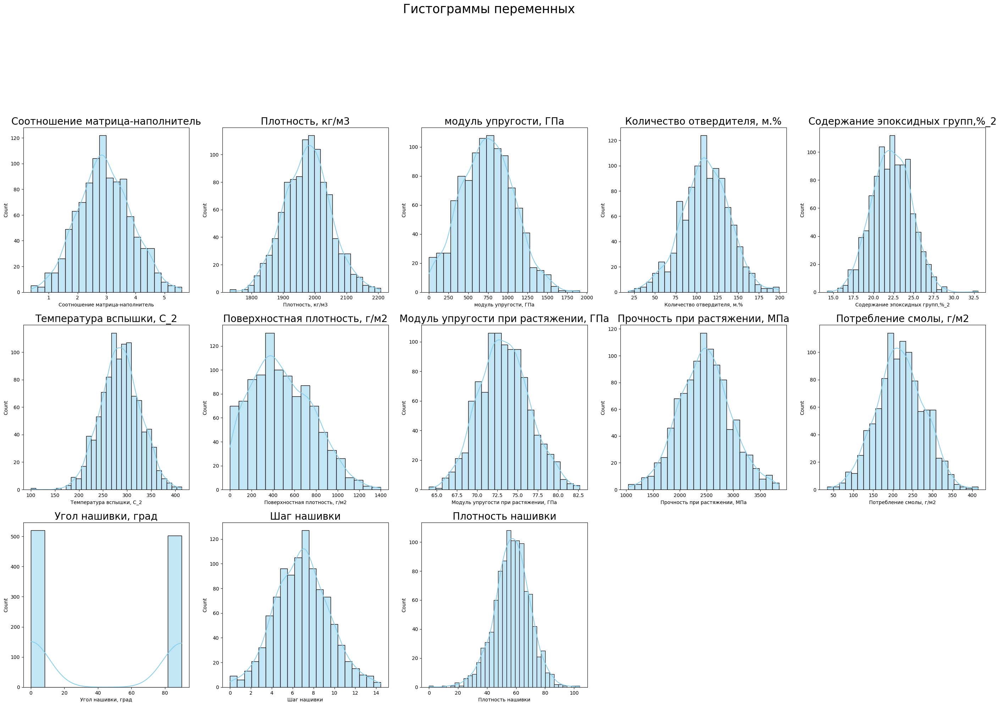

In [204]:
# Строим холст для нанесения 13 графиков (по количеству столбцов).
a = 5 # количество графиков в строке холста
b = 5 # количество график в столбце холста
c = 1 # порядковый номер графика

plt.figure(figsize = (35,35))
plt.suptitle('Гистограммы переменных', fontsize = 25)

for i in df:
    plt.subplot(a, b, c)
    sns.histplot(data=df[i], kde=True, color="skyblue")
    plt.title(i, size = 20)
    c = c + 1

Отмечаем, что распределение переменной "Угол нашивки, град" бимодально, т.е. содержит только два значения - 0 и 90. Отмечаем, что на гисторграмме переменной "Поверхностная плотность, г/м2" наблюдается ассиметрия вправо.
По остальным переменным распределение напоминает нормальное.

Проверяем нормальность распределения данных

Проводим статистический тест Шапиро-Уилка, который позволяет проверить гипотезу о нормальности распределения данных. Используем модуль stats.

In [205]:
#Проверка на нормальность в Scipy
for i in list(df.columns.values):
  stat, p = stats.shapiro(df[i]) # тест Шапиро-Уилк
  print(i)
  print('Statistics=%.3f, p-value=%.3f' % (stat, p))

  alpha = 0.05
  if p > alpha:
      print('Принять гипотезу о нормальности распределения\n')
  else:
      print('Отклонить гипотезу о нормальности распределения\n')
      

Соотношение матрица-наполнитель
Statistics=0.998, p-value=0.278
Принять гипотезу о нормальности распределения

Плотность, кг/м3
Statistics=0.999, p-value=0.550
Принять гипотезу о нормальности распределения

модуль упругости, ГПа
Statistics=0.996, p-value=0.007
Отклонить гипотезу о нормальности распределения

Количество отвердителя, м.%
Statistics=0.998, p-value=0.209
Принять гипотезу о нормальности распределения

Содержание эпоксидных групп,%_2
Statistics=0.998, p-value=0.265
Принять гипотезу о нормальности распределения

Температура вспышки, С_2
Statistics=0.998, p-value=0.283
Принять гипотезу о нормальности распределения

Поверхностная плотность, г/м2
Statistics=0.978, p-value=0.000
Отклонить гипотезу о нормальности распределения

Модуль упругости при растяжении, ГПа
Statistics=0.998, p-value=0.174
Принять гипотезу о нормальности распределения

Прочность при растяжении, МПа
Statistics=0.998, p-value=0.221
Принять гипотезу о нормальности распределения

Потребление смолы, г/м2
Statisti

На основании гистограмм распределения и статистического теста Шапиро-Уилка делаем выводы о том, что значения переменных "Соотношение матрица-наполнитель", "Плотность, кг/м3","Количество отвердителя, м.%", "Содержание эпоксидных групп,%_2", "Температура вспышки, С_2", "Модуль упругости при растяжении, ГПа", "Прочность при растяжении, МПа", "Потребление смолы, г/м2", "Шаг нашивки" распределены нормально.

Значения переменных "модуль упругости, ГПа", "Поверхностная плотность, г/м2", "Угол нашивки, град", "Плотность нашивки" распределены не нормально.

Строим диаграммы размаха (боксплот) по каждому столбцу (переменной) в датасете

Диаграмма размаха — это статистический инструмент для визуализации распределения данных. Она выглядит как прямоугольник с линиями по краям, которые указывают на минимальные и максимальные значения. Диаграммы размаха позволяют сделать наблюдения о таких о ключевых значениях, например как: 
- средний показатель, медиана 25го перцентиля и так далее;
- наличие выбросов и каковы их значения;
- о симметричности распределния данных, группиповки данных;
- направления смещения данных.

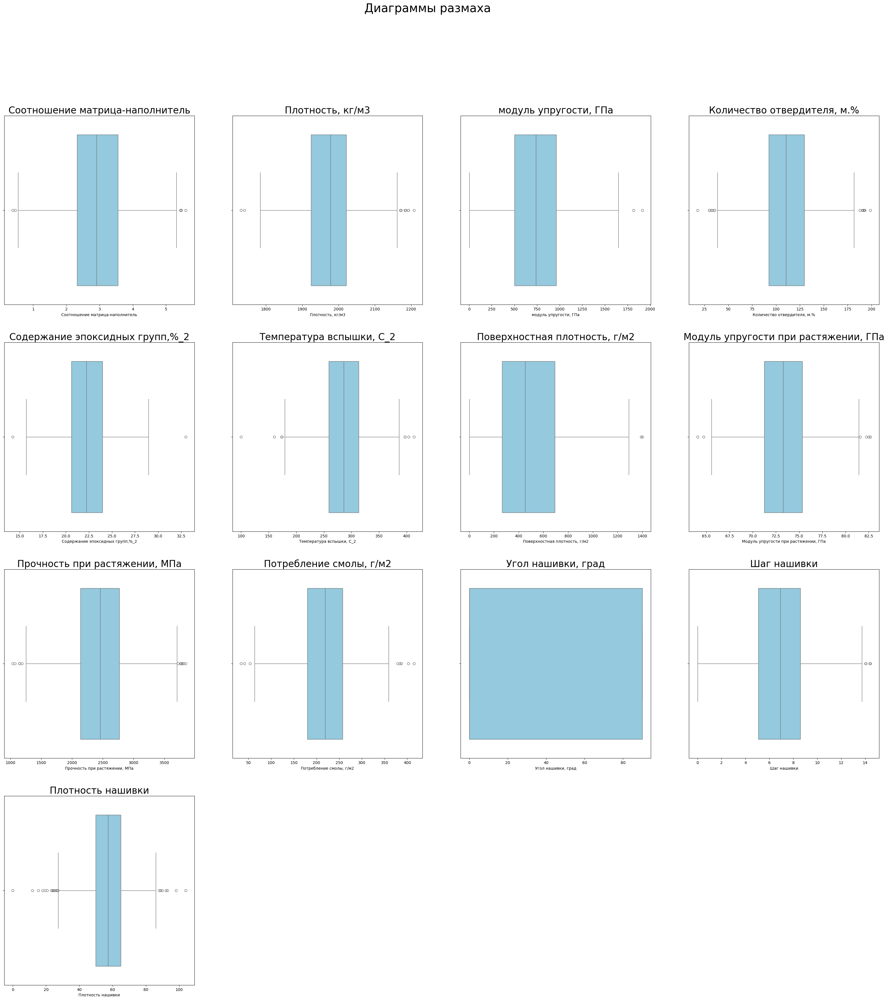

In [206]:
# Строим холст для нанесения 13 графиков (по количеству столбцов).

a = 4 # количество графиков в строке холста
b = 4 # количество график в столбце холста
c = 1 # порядковый номер графика

plt.figure(figsize = (40,40))
plt.suptitle('Диаграммы размаха', fontsize = 30)

for i in df:
    plt.subplot(a, b, c)
    sns.boxplot(data = df[i], color = "skyblue", orient='h')
    plt.title(i, size = 24)
    c = c + 1


Обнаруживаем, что в каждой переменной имеются выбросы, за исключением переменной - "Угол нашивки". Переменная "Угол нашивки" является бимодальной и содержит только значения 0 и 90.

Строим парные диаграммы рассеяния точек

Отображаемые на диаграммах рассеяния паттерны позволяют увидеть разные типы корреляции. Среди них: положительная (оба значения увеличиваются), отрицательная (одно значение увеличивается, в то время как второе уменьшается), нулевая (отсутствие корреляции), линейная, экспоненциальная и подковообразная. Сила корреляции определяется по тому, насколько близко расположены друг от друга точки на графике. Точки, которые значительно удалены от общего кластера точек, называются выбросами.

<function matplotlib.pyplot.show(close=None, block=None)>

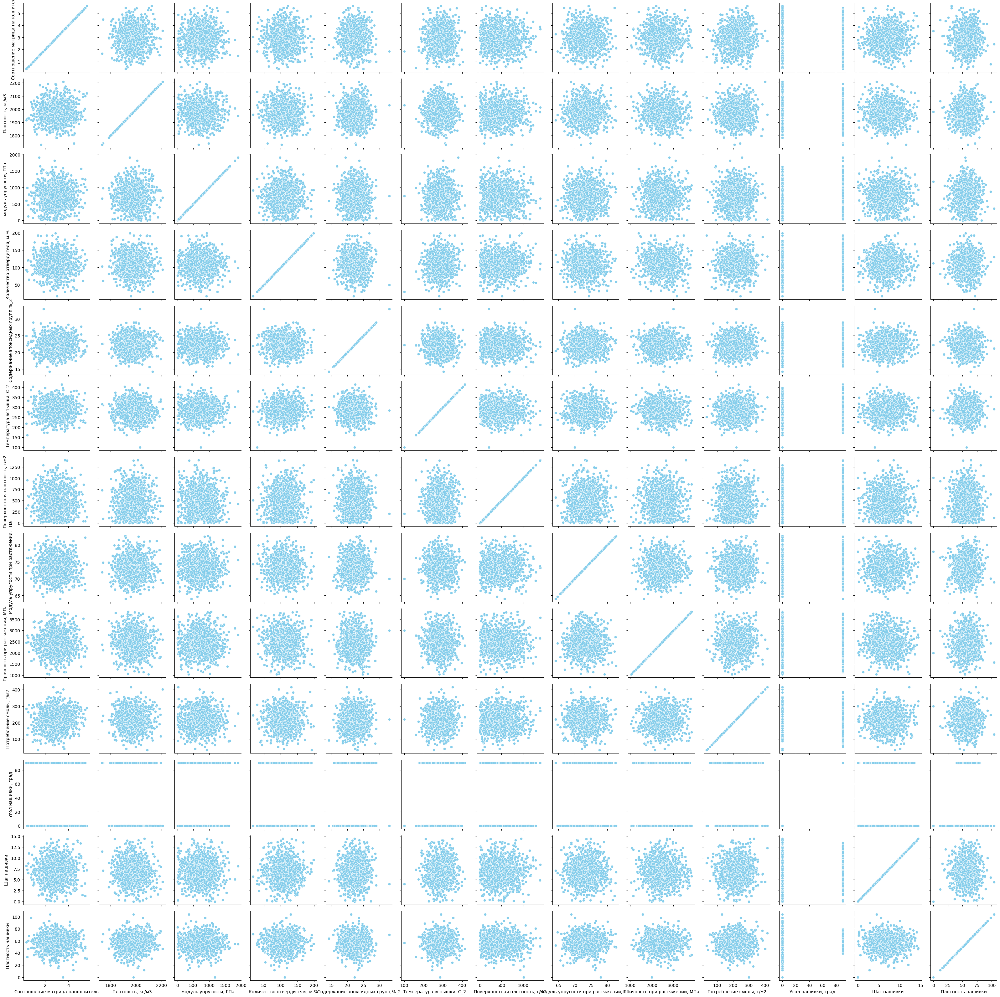

In [207]:
# для отрисовки диаграмм рассеяния используем модуль seaborn
parn_gr_rass = sns.PairGrid(df[df.columns])
parn_gr_rass.map(sns.scatterplot, color="skyblue")
plt.show

Обнаруживаем отсутствие как положительной, так и отрицательной корреляции между переменными.Из диаграмм рассеяния можно сделать вывод об отсутствии корреляции между переменными. Так же на диаграммах рассеяния видны размещенные точки (выбросы)

Дополнительно проверяем наличие корреляции между переменными. Используем метод pd.DataFrame.corr() и вычисляем значение коэффициента корреляции значений переменных в столбцах.

In [208]:
df.corr()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
Соотношение матрица-наполнитель,1.000000,0.003841,0.031700,-0.006445,0.019766,-0.004776,-0.006272,-0.008411,0.024148,0.072531,-0.031073,0.036437,-0.004652
"Плотность, кг/м3",0.003841,1.000000,-0.009647,-0.035911,-0.008278,-0.020695,0.044930,-0.017602,-0.069981,-0.015937,-0.068474,-0.061015,0.080304
"модуль упругости, ГПа",0.031700,-0.009647,1.000000,0.024049,-0.006804,0.031174,-0.005306,0.023267,0.041868,0.001840,-0.025417,-0.009875,0.056346
"Количество отвердителя, м.%",-0.006445,-0.035911,0.024049,1.000000,-0.000684,0.095193,0.055198,-0.065929,-0.075375,0.007446,0.038570,0.014887,0.017248
"Содержание эпоксидных групп,%_2",0.019766,-0.008278,-0.006804,-0.000684,1.000000,-0.009769,-0.012940,0.056828,-0.023899,0.015165,0.008052,0.003022,-0.039073
"Температура вспышки, С_2",-0.004776,-0.020695,0.031174,0.095193,-0.009769,1.000000,0.020121,0.028414,-0.031763,0.059954,0.020695,0.025795,0.011391
"Поверхностная плотность, г/м2",-0.006272,0.044930,-0.005306,0.055198,-0.012940,0.020121,1.000000,0.036702,-0.003210,0.015692,0.052299,0.038332,-0.049923
"Модуль упругости при растяжении, ГПа",-0.008411,-0.017602,0.023267,-0.065929,0.056828,0.028414,0.036702,1.000000,-0.009009,0.050938,0.023003,-0.029468,0.006476
"Прочность при растяжении, МПа",0.024148,-0.069981,0.041868,-0.075375,-0.023899,-0.031763,-0.003210,-0.009009,1.000000,0.028602,0.023398,-0.059547,0.019604
"Потребление смолы, г/м2",0.072531,-0.015937,0.001840,0.007446,0.015165,0.059954,0.015692,0.050938,0.028602,1.000000,-0.015334,0.013394,0.012239


Корреляция - это статистическая взаимосвязь между двумя или более переменными. Она указывает на то, насколько изменения в одной переменной связаны с изменениями в другой. Если изменение одной переменной сопровождается систематическим изменением другой, то говорят о наличии корреляции. Корреляция не обязательно означает причинно-следственную связь, то есть изменение одной переменной не обязательно является причиной изменения другой, они могут быть связаны через третью переменную или просто случайно. 

Коэффициент корреляции:
Для измерения силы и направления связи между переменными используется коэффициент корреляции, который обычно принимает значения от -1 до +1.
Значение, близкое к +1 или -1, указывает на сильную корреляцию, а значение, близкое к 0, указывает на слабую или отсутствующую корреляцию. 

Дополнительно стороим тепловую карту попарной корреляции столбцов датасета.

<Axes: >

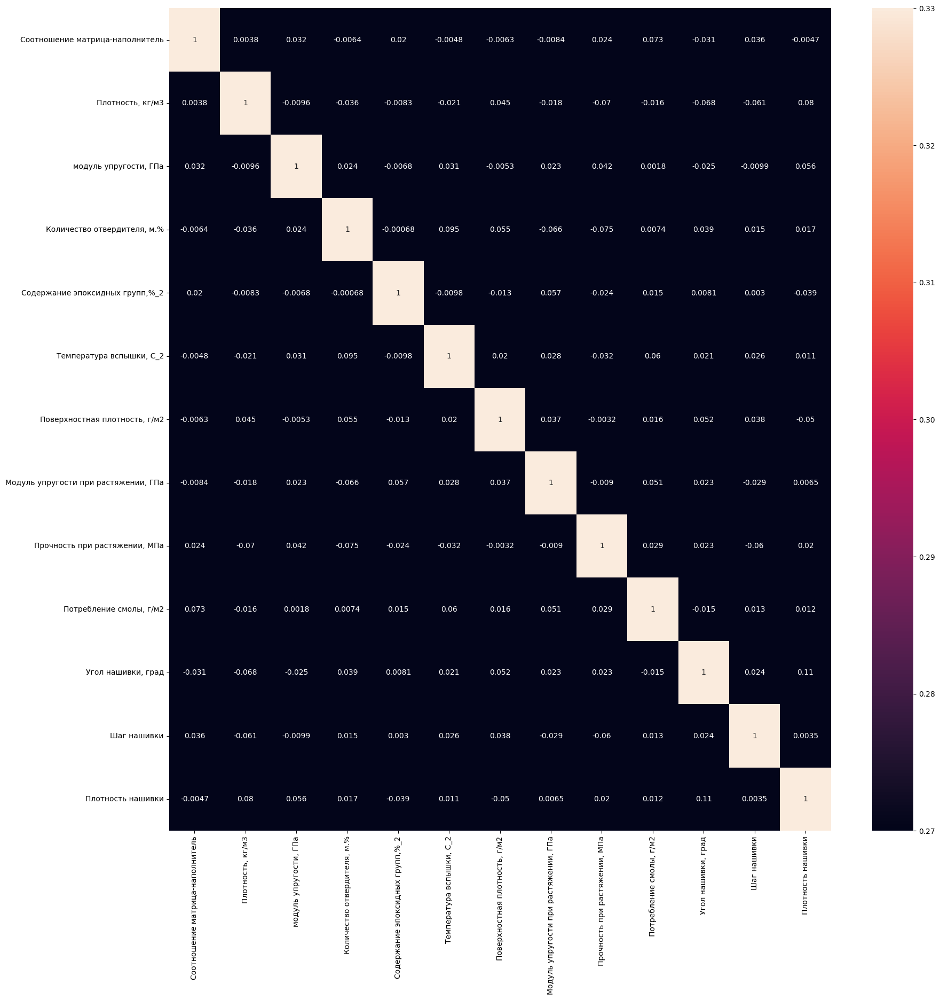

In [209]:
#Отобразим тепловую матрицу для наглядности
fig = plt.figure(figsize = (20,20))
sns.heatmap(df.corr(), annot = True, vmax=0.3, vmin=0.3)

Отмечаем, что большинство значений коэффициента корреляции близко к 0, что указывает на отсутствие корреляции. Максимальное значение коэффициента корреляции составляет 0.11 между переменными "Плотность нашивки" и "Угол нашивки, град", что говорит о наличии очень слабой силе связи между переменными.

**Обработка данных датасета**

In [210]:
df.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,0,4.0,57.0
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,60.0
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,70.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0,5.0,47.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,57.0


Обрабатываем значения переменной "Угол нашивки, град".

Как установлено ранее, переменная имеет значения 0 или 90 градусов, распределение значения отличается от нормального.
Кроме того, учитываем следующую информацию.
Угол нашивки в композитных материалах, или угол ориентации волокна, определяет направление волокон в слое композита. Он влияет на прочность и жесткость композитного материала, а также на его поведение при нагрузках. 
Угол нашивки (направления волокна) - это угол между направлением волокон в слое композитного материала и некоторым эталонным направлением (обычно осью X или L).
Угол нашивки обычно указывается в градусах. Например, 0° означает, что волокна параллельны эталонной оси, а 90° - перпендикулярны. 
Влияние на характеристики композита:
Прочность. Ориентация волокон влияет на прочность композита в разных направлениях. Композиты с ориентацией волокон, параллельной нагрузке, обычно имеют большую прочность на растяжение, чем те, где волокна перпендикулярны нагрузке. 
Жесткость.Аналогично прочности, угол ориентации волокон влияет на жесткость композита. Ориентация волокон, параллельная нагрузке, обычно обеспечивает большую жесткость. 
Устойчивость к трещинам.Угол ориентации волокон может влиять на скорость распространения трещин в композите. В некоторых случаях, использование углов 45° или -45° может снижать риск быстрого разрушения. 
Вес.Композитные материалы могут быть легче и иметь при этом лучшие характеристики, чем традиционные металлы. Это достигается за счет оптимального выбора ориентации волокон. 
Примеры:
0°:Волокна параллельны оси нагрузки, обеспечивая максимальную прочность на растяжение в этом направлении. 
90°:Волокна перпендикулярны оси нагрузки, обеспечивая высокую прочность на сжатие и сдвиг в этом направлении. 
45°/-45°:Ориентация волокон под углом 45° и -45° относительно оси нагрузки может повысить сопротивление композита к сдвиговым нагрузкам и снизить риск хрупкого разрушения. 

Необходимо отметить, что категориальные переменные — это те переменные, которые выражены ограниченным диапазоном значений. В нашем случае "Угол нашивки, град" выражен только 2 значениями - 0 или 90. В данном случае "Угол нашивки, град" необходимо отнести к номинальной переменной. Т.к. установить порядок и ранжирование значений не возможно.

При этом необходимо отметить, что угол нашивки будет влиять на свойство композитного материала в завимости от ориентации волокон. При этом из датасета не ясно в каком направлении применялась сила (перпендикулярно, параллельно или под иным углом) при замерах значений в датасете.

Кроме того, для того, чтобы оценить свойства композитного материала в зависмости от оси направления силы по отношению к углу нашивки необходимо проводить несколько испытаний с целью понимания на сколько угол нашивки влияет на отдельные свойства композитного материала. Из дата сета мы видим что в таблице № 2 было представлено по 520 значений угла нашивки, но исследование уникальных значений показало, что мы не можем определить что происходило 2 замера одного и того же композитного материала в зависимости от направления угла нашивки.
Кроме того, мы не можем определить направление оси применения силы при замерах. Так же неясно направление применение силы которое необходимо учитывать при обучении алгоритма машинного обучения, который будет определять значения:
- Модуль упругости при растяжении, ГПа;
- Прочность при растяжении, МПа.

Таким образом, итоговые значения композитного материала могут изменяться в завимости от направления применения силы по отношению к углу нашивки. Но ввиду вышеуказанного мы не можем ранжировать значения угла нашивки или говорить о том, что значение 90 лучше чем значение 0, или наоборот.

В связи с чем мы кодируем переменную "Угол нашивки, град" как категориальную с использованием OneHotEncoder.
OneHotEncoder - это метод, используемый в машинном обучении для представления категориальных данных в виде числовых данных. Он преобразует каждую категорию в двоичный вектор, где только один элемент "включен" (1), а остальные "выключены" (0). Этот метод имеет решающее значение для алгоритмов, требующих числового ввода, и помогает предотвратить неправильное толкование порядковых отношений между категориями.

In [211]:
# Осуществляем кодирование переменной "Угол нашивки, град"
ohe = OneHotEncoder(sparse_output=False)
ohe.fit_transform(df[['Угол нашивки, град']])
ohe.get_feature_names_out()
df[['Угол нашивки, град_0', 'Угол нашивки, град_90']] = ohe.fit_transform(df[['Угол нашивки, град']])
df.drop('Угол нашивки, град', axis=1, inplace=True)

In [212]:
# Проверям внесенные изменения в датафрейм
df.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Шаг нашивки,Плотность нашивки,"Угол нашивки, град_0","Угол нашивки, град_90"
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,4.0,57.0,1.0,0.0
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,4.0,60.0,1.0,0.0
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,4.0,70.0,1.0,0.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,5.0,47.0,1.0,0.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,5.0,57.0,1.0,0.0


Температура вспышки

Датафрейм содержит переменную "Температура вспышки, С_2".

Температура вспышки – это минимальная температура, при которой вещество выделяет достаточно паров, чтобы при поднесении источника зажигания произошло воспламенение паров и их кратковременное горение, но без устойчивого горения после удаления источника зажигания. Это важный параметр для оценки пожарной опасности веществ, особенно при их транспортировке, хранении и использовании. 
Температура вспышки не оказывает влияния на прочность и упругость изготовленного композитного материала. В связи с чем принимаем решения исключить из датасета переменную "Температура вспышки, С_2".

In [213]:
# исключаем переменную "Температура вспышки, С_2"
df.drop('Температура вспышки, С_2', axis=1, inplace=True)

In [214]:
# Проверяем датафрейм после удаления переменной
df.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Шаг нашивки,Плотность нашивки,"Угол нашивки, град_0","Угол нашивки, град_90"
0,1.857143,2030.0,738.736842,30.00,22.267857,210.0,70.0,3000.0,220.0,4.0,57.0,1.0,0.0
1,1.857143,2030.0,738.736842,50.00,23.750000,210.0,70.0,3000.0,220.0,4.0,60.0,1.0,0.0
2,1.857143,2030.0,738.736842,49.90,33.000000,210.0,70.0,3000.0,220.0,4.0,70.0,1.0,0.0
3,1.857143,2030.0,738.736842,129.00,21.250000,210.0,70.0,3000.0,220.0,5.0,47.0,1.0,0.0
4,2.771331,2030.0,753.000000,111.86,22.267857,210.0,70.0,3000.0,220.0,5.0,57.0,1.0,0.0


Работа с Эпоксидными группами и Смолами

В датафрейме присутвуют 2 переменные "Потребление смолы г/м2" и "Содержание эпоксидных групп, %_2". 

Зная, что эпоксидные группы – это структурные единицы в молекулах эпоксидных смол, которые обеспечивают их способность к отвердеванию под действием отвердителей. Они представляют собой тричленный цикл, содержащий один атом кислорода, и также называются оксиранами или эпоксидами. Эти группы реагируют с отвердителями, образуя сшитые (сетчатые) полимеры, которые отличаются высокой прочностью и устойчивостью к различным воздействиям.

Таким образом, не смотря на отсутствие корреляции между указанными переменными, мы видим, что "Содержание эпоксидных групп, %_2" дано в процентном соотношении и знаем о том, что эпоксидные группы содержатся в смолах. Значения смол приведено граммах в столбце "Потребление смолы г/м2".

Поэтому принимаем, решение вычислить значение эпоксидных смол в содержащихся в смолах. Проводим вычисления и изменяем датасет фиксируем итоговое значение эпоксидных групп и количество смол (за вычетом содержащихся в них эпоксидных групп).

In [215]:
df['Содержание эпоксидных групп, г'] = df['Потребление смолы, г/м2'] * (df['Содержание эпоксидных групп,%_2'] / 100) 

In [216]:
df.drop('Содержание эпоксидных групп,%_2', axis=1, inplace=True)

In [217]:
df['Потребление смолы, г/м2 без ЭГ'] = df['Потребление смолы, г/м2'] - df['Содержание эпоксидных групп, г']

In [218]:
df.drop('Потребление смолы, г/м2', axis=1, inplace=True)

In [219]:
# проверяем верность внесенных изменений
df.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа",Шаг нашивки,Плотность нашивки,"Угол нашивки, град_0","Угол нашивки, град_90","Содержание эпоксидных групп, г","Потребление смолы, г/м2 без ЭГ"
0,1.857143,2030.0,738.736842,30.00,210.0,70.0,3000.0,4.0,57.0,1.0,0.0,48.989286,171.010714
1,1.857143,2030.0,738.736842,50.00,210.0,70.0,3000.0,4.0,60.0,1.0,0.0,52.250000,167.750000
2,1.857143,2030.0,738.736842,49.90,210.0,70.0,3000.0,4.0,70.0,1.0,0.0,72.600000,147.400000
3,1.857143,2030.0,738.736842,129.00,210.0,70.0,3000.0,5.0,47.0,1.0,0.0,46.750000,173.250000
4,2.771331,2030.0,753.000000,111.86,210.0,70.0,3000.0,5.0,57.0,1.0,0.0,48.989286,171.010714


Таким образом, добавлены 2 новых переменных "Содержание эпоксидных групп, г" и "Потребление смолы, г/м2 без ЭГ". Так же понимаем, что существует связь отвердителя с взаимосвязью смолы и эпоксидных групп. Так как отвердитель и эпоксидные группы напрямую влияют на некоторые свойства композитных материалов. Так же существует сложности с трактованием значений отвердителя ввиду того, что он выражен в м.%. 
Кроме того, можем предположить, что данные переменные также могут прямо влиять на "плотность кг,м3". Но для формирования каких-либо выводом целесообразно получить консультацию у эксперта, так же желательно знать вид эпоксидных групп, смол и отвердителя, т.к. это напрямую влияет на характеристики.

Выбросы

Выброс — это экстремальные значения во входных данных, которые находятся далеко за пределами других наблюдений. 
Многие алгоритмы машинного обучения чувствительны к разбросу и распределению значений признаков обрабатываемых объектов. Соответственно, выбросы во входных данных могут исказить и ввести в заблуждение процесс обучения алгоритмов машинного обучения, что приводит к увеличению времени обучения, снижению точности моделей и, в конечном итоге, к снижению результатов. Даже до подготовки предсказательных моделей на основе обучающих данных выбросы могут приводить к ошибочным представлениям и в дальнейшем к ошибочной интерпретации собранных данных.

Ввиду того, что мы существенно изменили датафрейм. Отобразим повторно диаграммы размаха

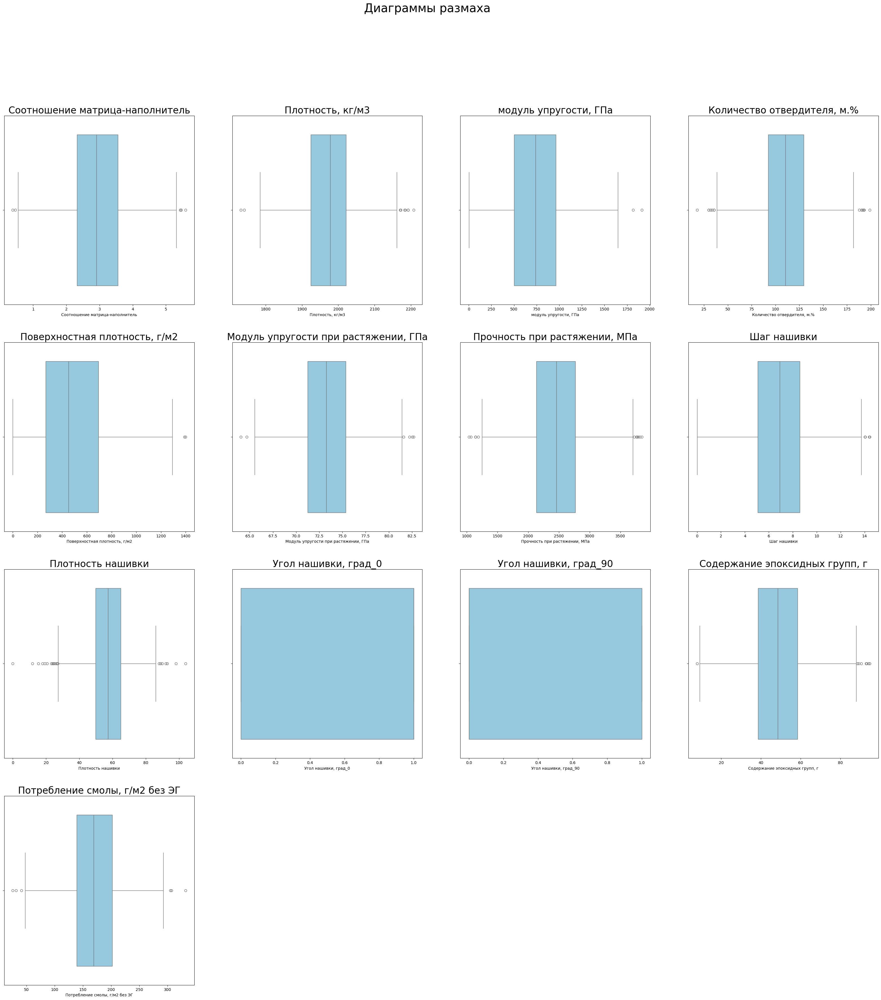

In [220]:
a = 4 # количество графиков в строке холста
b = 4 # количество график в столбце холста
c = 1 # порядковый номер графика

plt.figure(figsize = (40,40))
plt.suptitle('Диаграммы размаха', fontsize = 30)

for i in df:
    plt.subplot(a, b, c)
    sns.boxplot(data=df[i], color="skyblue", orient="h")
    plt.title(i, size = 24)
    c = c + 1

Диаграммы размаха указывают на наличие выбросов в переменных, за исключением кодированных переменных "Угол нашивки, град_0" и "Угол нашивки_град_90".

Присваеваем выбросам значение NaN (пустое значение)

In [221]:
for col in df.columns:
    q75, q25 = np.percentile(df.loc[:, col], [75, 25])
    intr_qr = q75 - q25

    max = q75 + (1.5 * intr_qr)
    min = q25 - (1.5 * intr_qr)

    df.loc[df[col] < min, col] = np.nan
    df.loc[df[col] > max, col] = np.nan


Проверка количества выбросов (пустых значений)

In [222]:
df.isnull().sum().sum()

np.int64(89)

Количество выбросов составляет 89, что составляет 8.7% от общего количества значений в выборке. Принимаем решение об удалении выбросов.

In [223]:
df = df.dropna(axis=0)

In [224]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 940 entries, 1 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       940 non-null    float64
 1   Плотность, кг/м3                      940 non-null    float64
 2   модуль упругости, ГПа                 940 non-null    float64
 3   Количество отвердителя, м.%           940 non-null    float64
 4   Поверхностная плотность, г/м2         940 non-null    float64
 5   Модуль упругости при растяжении, ГПа  940 non-null    float64
 6   Прочность при растяжении, МПа         940 non-null    float64
 7   Шаг нашивки                           940 non-null    float64
 8   Плотность нашивки                     940 non-null    float64
 9   Угол нашивки, град_0                  940 non-null    float64
 10  Угол нашивки, град_90                 940 non-null    float64
 11  Содержание эпоксидных г

Обнаруженные выбросы удалены. Повторно строим диаграммы размаха (боксплоты) с целью обнаружения выбросов

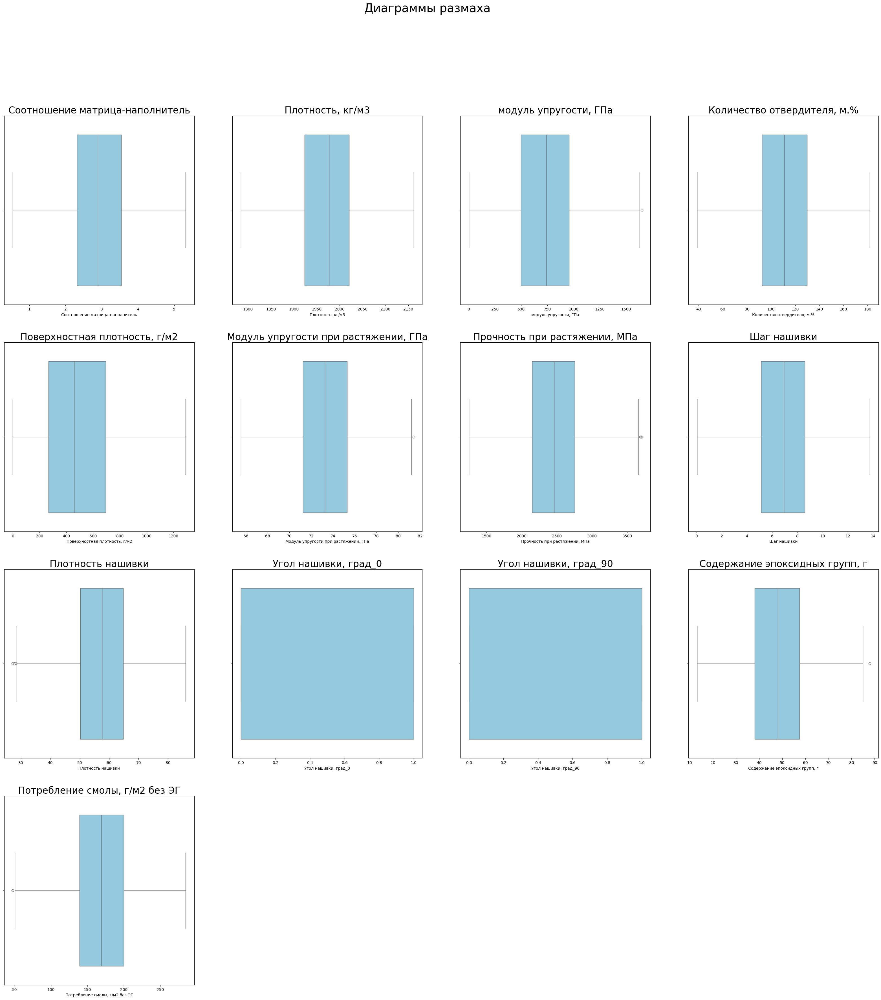

In [225]:
a = 4 # количество графиков в строке холста
b = 4 # количество график в столбце холста
c = 1 # порядковый номер графика

plt.figure(figsize = (40,40))
plt.suptitle('Диаграммы размаха', fontsize = 30)

for i in df:
    plt.subplot(a, b, c)
    sns.boxplot(data=df[i], color="skyblue", orient="h")
    plt.title(i, size = 24)
    c = c + 1

Некоторое количество выбросов осталось. Повторяем процедуру удаления выбросов.

In [226]:
for col in df.columns:
    q75, q25 = np.percentile(df.loc[:, col], [75, 25])
    intr_qr = q75 - q25

    max = q75 + (1.5 * intr_qr)
    min = q25 - (1.5 * intr_qr)

    df.loc[df[col] < min, col] = np.nan
    df.loc[df[col] > max, col] = np.nan

In [227]:
df.isnull().sum().sum()

np.int64(11)

Обнаружено еще 11 выбросов. Исключаем их.

In [228]:
df = df.dropna(axis=0)

In [229]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 929 entries, 1 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       929 non-null    float64
 1   Плотность, кг/м3                      929 non-null    float64
 2   модуль упругости, ГПа                 929 non-null    float64
 3   Количество отвердителя, м.%           929 non-null    float64
 4   Поверхностная плотность, г/м2         929 non-null    float64
 5   Модуль упругости при растяжении, ГПа  929 non-null    float64
 6   Прочность при растяжении, МПа         929 non-null    float64
 7   Шаг нашивки                           929 non-null    float64
 8   Плотность нашивки                     929 non-null    float64
 9   Угол нашивки, град_0                  929 non-null    float64
 10  Угол нашивки, град_90                 929 non-null    float64
 11  Содержание эпоксидных г

Проверяем выборку на наличие выбросов с помощью построения диаграммы размаха.

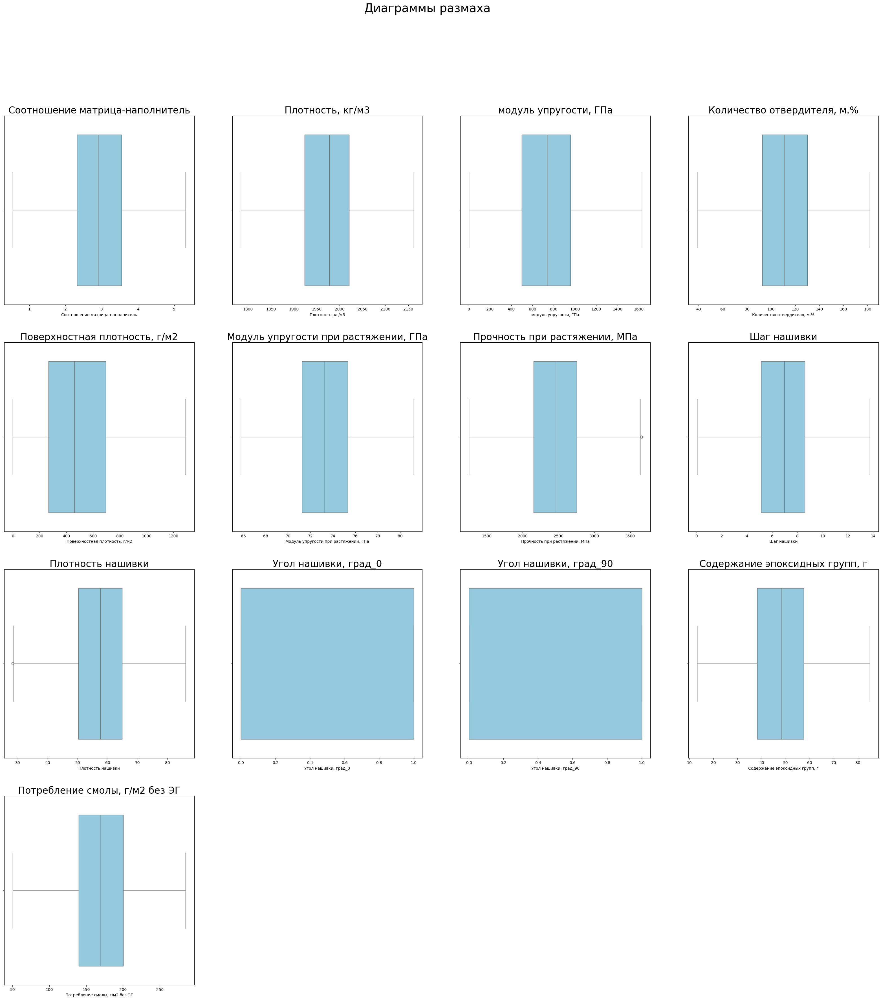

In [230]:
a = 4 # количество графиков в строке холста
b = 4 # количество график в столбце холста
c = 1 # порядковый номер графика

plt.figure(figsize = (40,40))
plt.suptitle('Диаграммы размаха', fontsize = 30)

for i in df:
    plt.subplot(a, b, c)
    sns.boxplot(data=df[i], color="skyblue", orient="h")
    plt.title(i, size = 24)
    c = c + 1

Некоторое количество выбросов осталось.

In [231]:
for col in df.columns:
    q75, q25 = np.percentile(df.loc[:, col], [75, 25])
    intr_qr = q75 - q25

    max = q75 + (1.5 * intr_qr)
    min = q25 - (1.5 * intr_qr)

    df.loc[df[col] < min, col] = np.nan
    df.loc[df[col] > max, col] = np.nan

In [232]:
df = df.dropna(axis=0)

In [233]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 925 entries, 1 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       925 non-null    float64
 1   Плотность, кг/м3                      925 non-null    float64
 2   модуль упругости, ГПа                 925 non-null    float64
 3   Количество отвердителя, м.%           925 non-null    float64
 4   Поверхностная плотность, г/м2         925 non-null    float64
 5   Модуль упругости при растяжении, ГПа  925 non-null    float64
 6   Прочность при растяжении, МПа         925 non-null    float64
 7   Шаг нашивки                           925 non-null    float64
 8   Плотность нашивки                     925 non-null    float64
 9   Угол нашивки, град_0                  925 non-null    float64
 10  Угол нашивки, град_90                 925 non-null    float64
 11  Содержание эпоксидных г

Еще одно построение диаграммы размаха

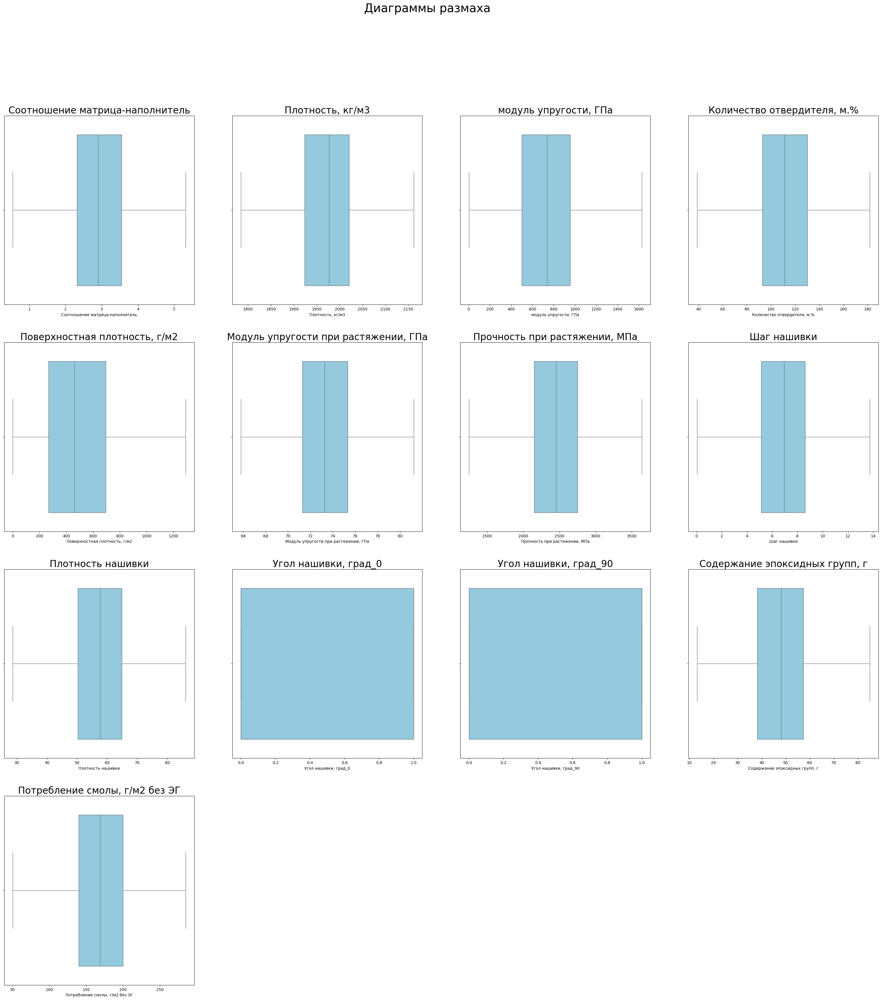

In [234]:
a = 4 # количество графиков в строке холста
b = 4 # количество график в столбце холста
c = 1 # порядковы номер графика

plt.figure(figsize = (40,40))
plt.suptitle('Диаграммы размаха', fontsize = 30)

for i in df:
    plt.subplot(a, b, c)
    sns.boxplot(data = df[i], color = "skyblue", orient='h')
    plt.title(i, size = 24)
    c = c + 1

Выбросы полностью исключены. 

Масштабирование данных

In [235]:
# выводим первые 5 строк датафрейма
df.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа",Шаг нашивки,Плотность нашивки,"Угол нашивки, град_0","Угол нашивки, град_90","Содержание эпоксидных групп, г","Потребление смолы, г/м2 без ЭГ"
1,1.857143,2030.0,738.736842,50.00,210.0,70.0,3000.0,4.0,60.0,1.0,0.0,52.250000,167.750000
2,1.857143,2030.0,738.736842,49.90,210.0,70.0,3000.0,4.0,70.0,1.0,0.0,72.600000,147.400000
3,1.857143,2030.0,738.736842,129.00,210.0,70.0,3000.0,5.0,47.0,1.0,0.0,46.750000,173.250000
4,2.771331,2030.0,753.000000,111.86,210.0,70.0,3000.0,5.0,57.0,1.0,0.0,48.989286,171.010714
5,2.767918,2000.0,748.000000,111.86,210.0,70.0,3000.0,5.0,60.0,1.0,0.0,48.989286,171.010714


In [236]:
# выводим размеры датафрейма
df.shape

(925, 13)

In [237]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,925.0,2.919068,0.897082,0.547391,2.314541,2.903233,3.546415,5.314144
"Плотность, кг/м3",925.0,1974.319439,71.143154,1784.482245,1923.255135,1977.302956,2020.828331,2161.565216
"модуль упругости, ГПа",925.0,735.328695,327.705942,2.436909,498.519344,738.736842,956.246864,1628.000000
"Количество отвердителя, м.%",925.0,111.086088,26.830806,38.668500,92.834720,111.157879,130.163998,181.828448
"Поверхностная плотность, г/м2",925.0,483.435186,279.103156,0.603740,267.140817,460.721126,694.589685,1291.340115
"Модуль упругости при растяжении, ГПа",925.0,73.304924,3.011295,65.793845,71.279418,73.253725,75.309657,81.203147
"Прочность при растяжении, МПа",925.0,2460.116851,450.916069,1250.392802,2149.974687,2456.395009,2751.235671,3636.892992
Шаг нашивки,925.0,6.918383,2.514591,0.037639,5.117477,6.947322,8.606411,13.732404
Плотность нашивки,925.0,57.568830,11.065402,28.661632,50.280645,57.615327,64.854936,86.012427
"Угол нашивки, град_0",925.0,0.486486,0.500088,0.000000,0.000000,0.000000,1.000000,1.000000


В значениях переменных есть большой разброс в их масштабе. Отдельные значения могут быть равны 0 и/или близки к нему, а другие измеряются в тысячах.
Ввиду того, что перед нами поставлена задача построения моделей машинного обучения и построение нейросети с целью прогноза значения зависимой переменной по значению незавимых переменных отмечаем факт необходимости масштабирования данных.

Масштабирование данных — это процесс преобразования числовых признаков в наборе данных к одному масштабу, чтобы они имели одинаковый диапазон значений. Это необходимо, потому что многие алгоритмы машинного обучения чувствительны к разным масштабам признаков, и масштабирование помогает избежать ситуации, когда один признак доминирует над другими.
Масштабирование применяется для:
Улучшение работы алгоритмов. Многие алгоритмы, особенно те, что основаны на расстоянии (например, KNN, K-means, SVM) или градиентном спуске, работают лучше, когда признаки имеют одинаковый масштаб. 
Предотвращение доминирования признаков. Если один признак имеет большой диапазон значений, а другой – маленький, то первый может оказывать большее влияние на модель, даже если его важность не выше. Масштабирование выравнивает вклад каждого признака. 
Оптимизация обучения. Масштабирование может ускорить процесс обучения модели и повысить ее точность. 

Масштабирования данных будет произведено непосредственно перед созданием обучающей и тестовой выборок при построении моделей машинного обучения и модели нейросети (в частях 2 и 3 настоящего блокнота).

Анализ итогового датасета

In [238]:
df.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа",Шаг нашивки,Плотность нашивки,"Угол нашивки, град_0","Угол нашивки, град_90","Содержание эпоксидных групп, г","Потребление смолы, г/м2 без ЭГ"
1,1.857143,2030.0,738.736842,50.00,210.0,70.0,3000.0,4.0,60.0,1.0,0.0,52.250000,167.750000
2,1.857143,2030.0,738.736842,49.90,210.0,70.0,3000.0,4.0,70.0,1.0,0.0,72.600000,147.400000
3,1.857143,2030.0,738.736842,129.00,210.0,70.0,3000.0,5.0,47.0,1.0,0.0,46.750000,173.250000
4,2.771331,2030.0,753.000000,111.86,210.0,70.0,3000.0,5.0,57.0,1.0,0.0,48.989286,171.010714
5,2.767918,2000.0,748.000000,111.86,210.0,70.0,3000.0,5.0,60.0,1.0,0.0,48.989286,171.010714


Наименование столбцов и описание их значений

| Наименование столбцa | Описание поля                | 
|:-------------     |:---------------:              | 
| Соотношение матрица-наполнитель       | Матрица - это связующее вещество, в которое внедрен наполнитель (волокна, частицы, слои). Соотношение может быть выражено в процентах или в виде объемного или весового соотношения.| 
| Плотность, кг/м3| Физическая величина, характеризующая массу вещества, содержащегося в единице объема. Выражен в килограмме на кубический метр.| 
| модуль упругости, ГПа  | Физическая величина, характеризующая способность твердого тела сопротивляться упругой деформации при приложении к нему силы. Выражен в Гигапаскаль.| 
| Количество отвердителя, м.%           | Отвердитель  – это химическое вещество, которое добавляется к лакокрасочным материалам, эпоксидным смолам и другим реакционноспособным олигомерам для ускорения или инициирования процесса отверждения (застывания, полимеризации).|
| Поверхностная плотность, г/м2           | Величина, характеризующая массу вещества, приходящуюся на единицу площади. Выражен в грамм на метр кубический |
| Модуль упругости при растяжении, ГПа          | Оценивает упругость жестких или твердых материалов, которая является соотношением между деформацией материала и силой, необходимой для его деформации. Выражен в Гигапаскаль.|
| Прочность при растяжении, МПа         | Максимальное напряжение, которое материал может выдержать при растягивающей нагрузке до начала разрушения. Это важный показатель для оценки прочности и надежности материалов. Выжаражен в Мегапаскаль.|
| Шаг нашивки        | Шаг нашивки         |
| Плотность нашивки       | Плотность нашивки        |
| Угол нашивки, град_0       | Угол нашивки равный 0 градусам        |
| Угол нашивки, град_90       | Угол нашивки равный 90 градусам        |
| Содержание эпоксидных групп, г       | Количество эпоксидных групп в смоле (в граммах). Эпоксидные группы – это структурные единицы в молекулах эпоксидных смол, которые обеспечивают их способность к отвердеванию под действием отвердителей.       |
| Потребление смолы, г/м2 без ЭГ       | Потребление смолы за вычетом эпоксидных групп в смоле (в граммах/м2)        |


In [239]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 925 entries, 1 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       925 non-null    float64
 1   Плотность, кг/м3                      925 non-null    float64
 2   модуль упругости, ГПа                 925 non-null    float64
 3   Количество отвердителя, м.%           925 non-null    float64
 4   Поверхностная плотность, г/м2         925 non-null    float64
 5   Модуль упругости при растяжении, ГПа  925 non-null    float64
 6   Прочность при растяжении, МПа         925 non-null    float64
 7   Шаг нашивки                           925 non-null    float64
 8   Плотность нашивки                     925 non-null    float64
 9   Угол нашивки, град_0                  925 non-null    float64
 10  Угол нашивки, град_90                 925 non-null    float64
 11  Содержание эпоксидных г

In [240]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,925.0,2.919068,0.897082,0.547391,2.314541,2.903233,3.546415,5.314144
"Плотность, кг/м3",925.0,1974.319439,71.143154,1784.482245,1923.255135,1977.302956,2020.828331,2161.565216
"модуль упругости, ГПа",925.0,735.328695,327.705942,2.436909,498.519344,738.736842,956.246864,1628.000000
"Количество отвердителя, м.%",925.0,111.086088,26.830806,38.668500,92.834720,111.157879,130.163998,181.828448
"Поверхностная плотность, г/м2",925.0,483.435186,279.103156,0.603740,267.140817,460.721126,694.589685,1291.340115
"Модуль упругости при растяжении, ГПа",925.0,73.304924,3.011295,65.793845,71.279418,73.253725,75.309657,81.203147
"Прочность при растяжении, МПа",925.0,2460.116851,450.916069,1250.392802,2149.974687,2456.395009,2751.235671,3636.892992
Шаг нашивки,925.0,6.918383,2.514591,0.037639,5.117477,6.947322,8.606411,13.732404
Плотность нашивки,925.0,57.568830,11.065402,28.661632,50.280645,57.615327,64.854936,86.012427
"Угол нашивки, град_0",925.0,0.486486,0.500088,0.000000,0.000000,0.000000,1.000000,1.000000


Строим графики гистограмм распределения по каждому столбцу (переменной) в датасете

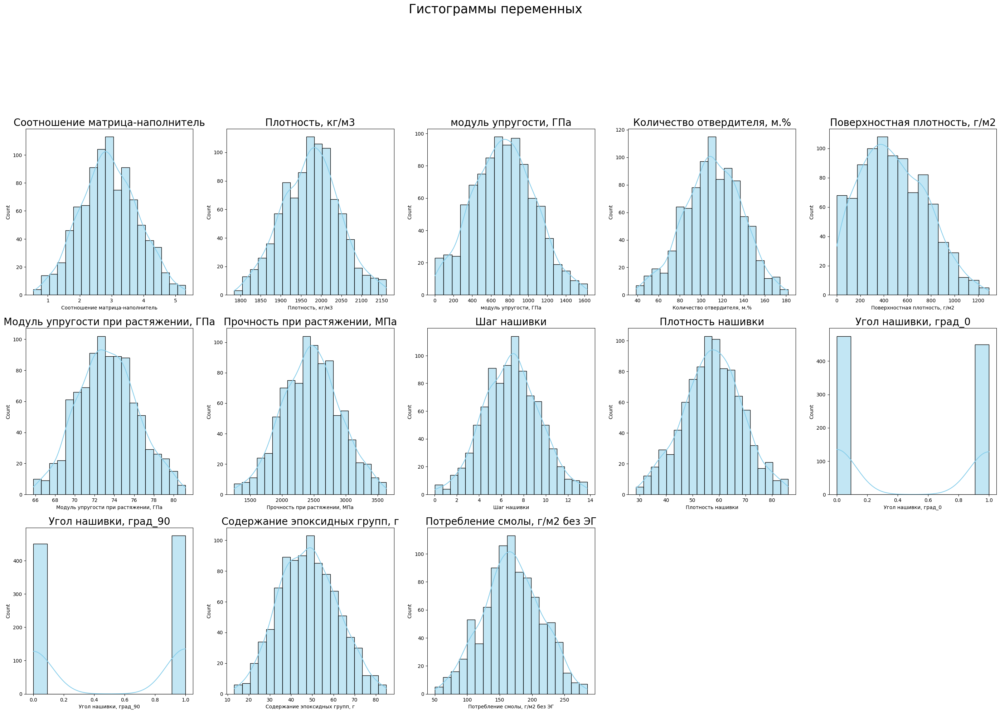

In [241]:
# Строим холст для нанесения 13 графиков (по количеству столбцов).
a = 5 # количество графиков в строке холста
b = 5 # количество график в столбце холста
c = 1 # порядковый номер графика

plt.figure(figsize = (35,35))
plt.suptitle('Гистограммы переменных', fontsize = 25)

for i in df:
    plt.subplot(a, b, c)
    sns.histplot(data=df[i], kde=True, color="skyblue")
    plt.title(i, size = 20)
    c = c + 1

Т.к. ранее переменная "Угол нашивки, град" кодирована с помощью OneHotEncoder и разнесена на переменные "Угол нашивки, град_0" и "Угол нашивки, град_90", то их распределение бимодально, т.е. содержит только два значения - 0 и 1. Отмечаем, что на гисторграмме переменной "Поверхностная плотность, г/м2" наблюдается ассиметрия вправо.
По остальным переменным распределение напоминает нормальное.

Проводим статистический тест Шапиро-Уилка, который позволяет проверить гипотезу о нормальности распределения данных. Используем модуль stats.

In [242]:
for i in list(df.columns.values):
  stat, p = stats.shapiro(df[i])
  print(i)
  print('Statistics=%.3f, p-value=%.3f' % (stat, p))

  alpha = 0.05
  if p > alpha:
      print('Принять гипотезу о нормальности распределения\n')
  else:
      print('Отклонить гипотезу о нормальности распределения\n')

Соотношение матрица-наполнитель
Statistics=0.997, p-value=0.098
Принять гипотезу о нормальности распределения

Плотность, кг/м3
Statistics=0.997, p-value=0.087
Принять гипотезу о нормальности распределения

модуль упругости, ГПа
Statistics=0.995, p-value=0.006
Отклонить гипотезу о нормальности распределения

Количество отвердителя, м.%
Statistics=0.997, p-value=0.045
Отклонить гипотезу о нормальности распределения

Поверхностная плотность, г/м2
Statistics=0.978, p-value=0.000
Отклонить гипотезу о нормальности распределения

Модуль упругости при растяжении, ГПа
Statistics=0.996, p-value=0.013
Отклонить гипотезу о нормальности распределения

Прочность при растяжении, МПа
Statistics=0.998, p-value=0.172
Принять гипотезу о нормальности распределения

Шаг нашивки
Statistics=0.998, p-value=0.312
Принять гипотезу о нормальности распределения

Плотность нашивки
Statistics=0.997, p-value=0.066
Принять гипотезу о нормальности распределения

Угол нашивки, град_0
Statistics=0.636, p-value=0.000
От

На основании гистограмм распределения и статистического теста Шапиро-Уилка делаем выводы о том, что значения переменных "Соотношение матрица-наполнитель", "Плотность, кг/м3", "Прочность при растяжении, МПа", "Шаг нашивки", "Плотность нашивки" распределены нормально.

Значения переменных "модуль упругости, ГПа", "Количество отвердителя, м.%", "Модуль упругости при растяжении, ГПа", "Поверхностная плотность, г/м2", "Угол нашивки, град_0", "Угол нашивки, град_0","Содержание эпоксидных групп, г", "Потребление смолы, г/м2 без ЭГ" распределены не нормально.

Если данные не распределены нормально, то применение параметрических статистических тестов, которые предполагают нормальность, может привести к неверным результатам. В таких случаях рекомендуется использовать непараметрические методы, которые не делают предположений о распределении данных.

Необходимо отметить, что после выделения отдельных новых признаков датасета, нормализации и устранения выбросов часть данных перестали быть распределенными нормальным образом. Были предприняты попытки нормализации распределения данных с помощью распределения Бокса-Кокса, логарифмизации и извлечения квадратного корня, но такие попытки не привели к нормализации распределения. В связи с чем принято решения работать с данными в имеющимся виде.

Строим диаграммы размаха по каждой переменной в итоговом датасете

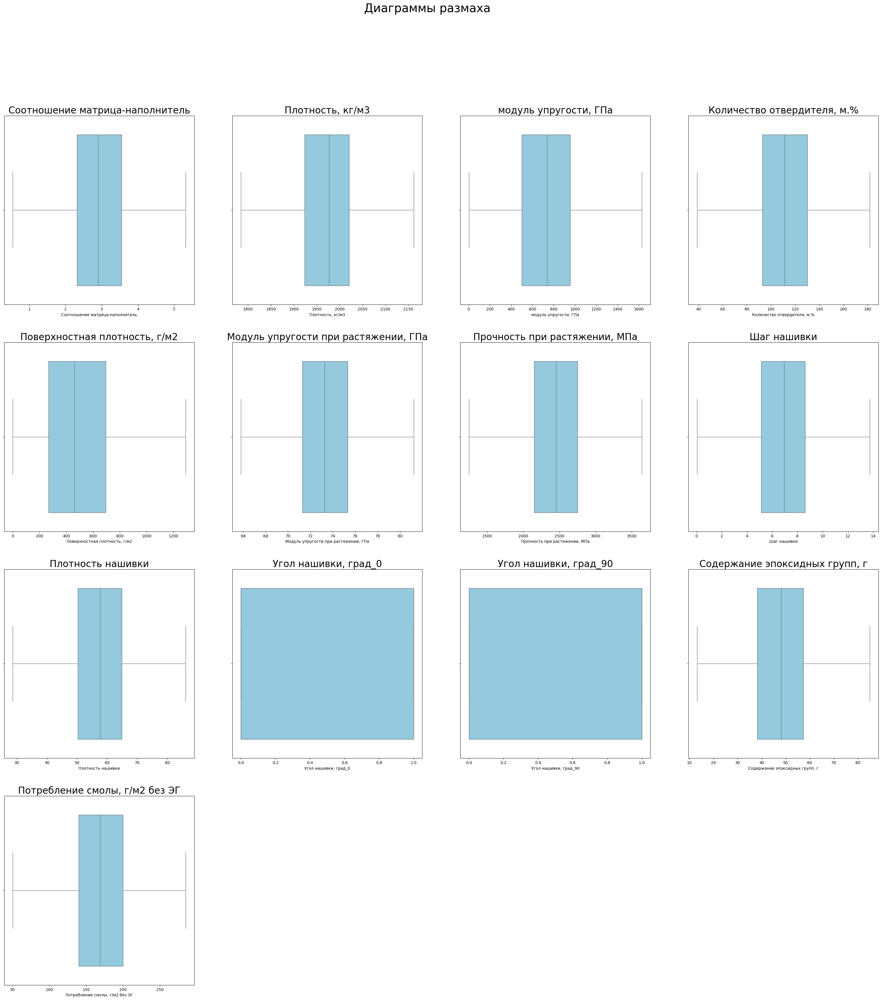

In [243]:
# Строим холст для нанесения 13 графиков (по количеству столбцов).
a = 4 # количество графиков в строке холста
b = 4 # количество график в столбце холста
c = 1 # порядковый номер графика

plt.figure(figsize = (40,40))
plt.suptitle('Диаграммы размаха', fontsize = 30)

for i in df:
    plt.subplot(a, b, c)
    sns.boxplot(data = df[i], color = "skyblue", orient='h')
    plt.title(i, size = 24)
    c = c + 1

Делаем вывод об отсутствии выбросов на основании диаграмм размаха.

Строим попарные диаграммы рассеяния каждой переменной в датасете

<function matplotlib.pyplot.show(close=None, block=None)>

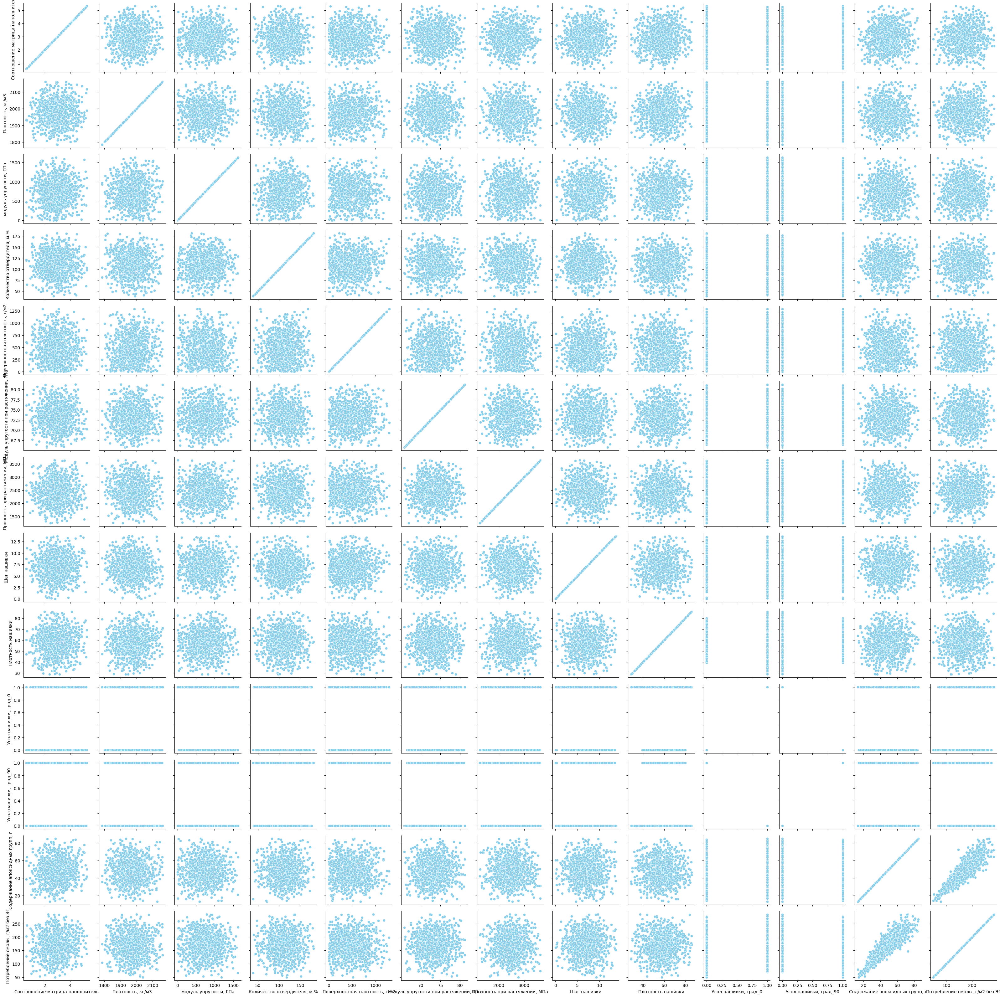

In [244]:
parn_gr_rass = sns.PairGrid(df[df.columns])
parn_gr_rass.map(sns.scatterplot, color="skyblue")
plt.show

Обнаруживаем сильную корреляцию между "Потреблением смолы, г/м2" и "Содержанием эпоксидных групп, г" с коэффициентом корреляция 0.86 (очень сильная связь), что не удивительно т.к. на основании информации о связи эпоксидных групп и их содержанием в смолах, данные признаки были доработаны.

По остальным признакам обнаружено отсутствие как положительной, так и отрицательной корреляции между переменными. Линейная связь обнаружена только между переменными "Потреблением смолы, г/м2" и "Содержанием эпоксидных групп, г", что может повлиять на исследования связанные с выявлением линейный связей.

Дополнительно с помощью метода pd.DataFrame.corr() вычисляем попарную корреляцию переменных в датафрейме.

In [245]:
df.corr()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа",Шаг нашивки,Плотность нашивки,"Угол нашивки, град_0","Угол нашивки, град_90","Содержание эпоксидных групп, г","Потребление смолы, г/м2 без ЭГ"
Соотношение матрица-наполнитель,1.000000,0.006542,0.055564,-0.003040,0.011418,-0.025333,0.017655,0.042252,0.044812,0.027447,-0.027447,0.066277,0.069049
"Плотность, кг/м3",0.006542,1.000000,0.000332,-0.045209,0.064960,-0.019442,-0.088375,-0.049241,0.078473,0.054210,-0.054210,-0.025589,-0.025332
"модуль упругости, ГПа",0.055564,0.000332,1.000000,0.048065,-0.010099,0.020775,0.027288,0.009450,0.076889,0.033468,-0.033468,-0.007213,-0.002584
"Количество отвердителя, м.%",-0.003040,-0.045209,0.048065,1.000000,0.039558,-0.053024,-0.068661,-0.013678,0.006798,-0.037753,0.037753,-0.005353,-0.008743
"Поверхностная плотность, г/м2",0.011418,0.064960,-0.010099,0.039558,1.000000,0.038745,-0.016811,0.039422,-0.031263,-0.049201,0.049201,-0.015456,-0.006632
"Модуль упругости при растяжении, ГПа",-0.025333,-0.019442,0.020775,-0.053024,0.038745,1.000000,-0.006631,-0.005490,0.005693,-0.035956,0.035956,0.058409,0.045717
"Прочность при растяжении, МПа",0.017655,-0.088375,0.027288,-0.068661,-0.016811,-0.006631,1.000000,-0.049983,0.014727,-0.026231,0.026231,0.001291,0.008875
Шаг нашивки,0.042252,-0.049241,0.009450,-0.013678,0.039422,-0.005490,-0.049983,1.000000,0.002886,-0.026675,0.026675,0.014175,0.007792
Плотность нашивки,0.044812,0.078473,0.076889,0.006798,-0.031263,0.005693,0.014727,0.002886,1.000000,-0.084994,0.084994,-0.005769,0.007016
"Угол нашивки, град_0",0.027447,0.054210,0.033468,-0.037753,-0.049201,-0.035956,-0.026231,-0.026675,-0.084994,1.000000,-1.000000,-0.022410,-0.004355


Дополнительно отобразим тепловую матрицу корреляции переменных датасета, т.к. визуализация данных позволяет лучше обнаружить наличие корреляции между переменными.


<Axes: >

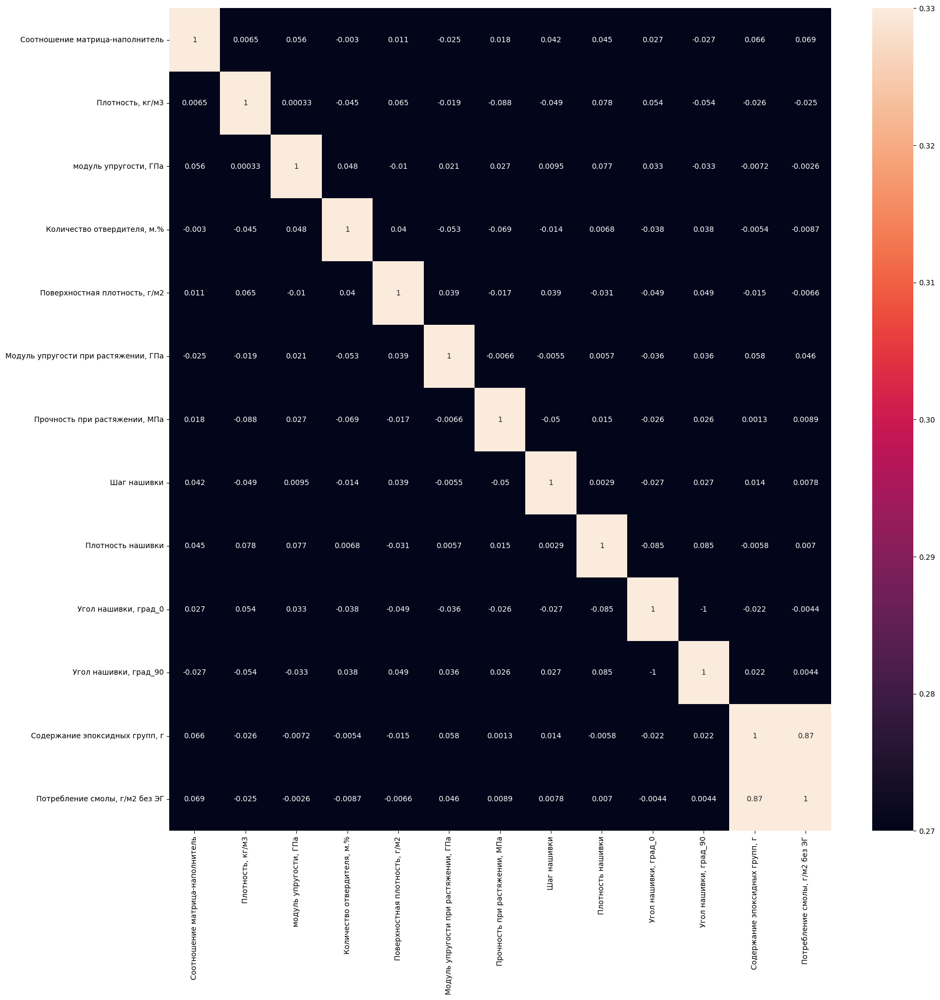

In [246]:
#Отобразим тепловую матрицу для наглядности
fig = plt.figure(figsize = (20,20))
sns.heatmap(df.corr(), annot = True, vmax=0.3, vmin=0.3)

 Обнаруживаем сильную корреляцию между "Потреблением смолы, г/м2" и "Содержанием эпоксидных групп, г" с коэффициентом корреляция 0.87 (очень сильная связь), что не удивительно т.к. на основании информации о связи эпоксидных групп и их содержанием в смолах, данные признаки были доработаны.
В отношении иных переменных значение коэффициента корреляции близко к 0, что указывает на отсутствие корреляции.

Проведен разведывательный анализ и предобратока датасета. Добавлено описание столбцов и их описание. Проведена работа с анализом, исключением и модификацией переменных:
- Исключена переменная "Температура вспышки, С_2", как не оказывающая влияние на предсказание значений "Модуль упругости при растяжении, ГПа", "Прочность при растяжении, МПа", "Соотношение матрица-наполнитель". 
- Переменная "Угол нашивки, град" переведена в раздел категориальных переменных и кодирована с помощью OneHotEncoder в переменные "Угол нашивки, град_0" и "Угол нашивки, град_90". 
- Так же проведен анализ взаимосвязи переменных "Содержание эпоксидных групп, %_2" и "Потребление смолы, г/м2", в результате чего переменные были изменены в переменные "Содержание эпоксидных групп, г" и "Потребление смолы, г/м2 без ЭГ". Так же выдвинуто предположение о наличии связей между плотностью, отвердителем, эпоксидными группами и смолами - в данной части необходима консультация с экспертом. 
Проведена визуализация данных. Построенны гистограммы распределения данных с KDE, диаграммы размаха, диаграммы рассеяния, тепловые карты. Проведен статистический тест для подтверждения нормальности распределения. 
Исключены выбросы. Исследована корреляция переменных.
Проведена нормализация данных.

Необходимо отметить, что многие переменные не распределены нормально, практически полное отсутствие корреляции между переменными и линейной связи, что может ухудшить предсказательную способность прогнозирующих моделей машинного обучения.


Сохраняем итоговый датасет в отдельный файл.

In [247]:
df.to_excel('db_itog_bez_norm.xlsx')